In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
import os
import numpy as np
import astropy.units as u
from astropy.coordinates import SkyCoord, Angle
from regions import CircleSkyRegion
from gammapy.spectrum import (
    SpectrumDatasetOnOff,
    SpectrumDataset,
    SpectrumDatasetMaker,
)
from gammapy.modeling import Fit, Parameter
from gammapy.modeling.models import (
    PowerLawSpectralModel,
    SpectralModel,
    SkyModel,
    ExpCutoffPowerLawSpectralModel,
)
from gammapy.irf import load_cta_irfs
from gammapy.data import Observation
from gammapy.maps import MapAxis

In [3]:
livetime = 48 * u.h
pointing = SkyCoord(0, 0, unit="deg", frame="galactic")
offset = 0.5 * u.deg
# Reconstructed and true energy axis
energy_axis = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 10), unit="TeV", name="energy", interp="log"
)
energy_axis_true = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 31), unit="TeV", name="energy", interp="log"
)

on_region_radius = Angle("0.11 deg")
on_region = CircleSkyRegion(center=pointing, radius=on_region_radius)

In [4]:
# Define spectral model - a simple Power Law in this case
model_simu = ExpCutoffPowerLawSpectralModel(
    index=2.22,
    amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
    reference=1 * u.TeV,
    lambda_=1 * u.Unit("TeV-1"),
    alpha = 1,
)
print(model_simu)
# we set the sky model used in the dataset
model = SkyModel(spectral_model=model_simu)

ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.000e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True


In [5]:
os.environ['CALDB'] = '/home/rishank/anaconda2/envs/cta/share/caldb/'
!echo $CALDB
!ls $CALDB

/home/rishank/anaconda2/envs/cta/share/caldb/
data


In [6]:
# Load the IRFs
# In this simulation, we use the CTA-1DC irfs shipped with gammapy.
irfs = load_cta_irfs(
    "$CALDB/data/cta/prod3b-v2/bcf/South_z20_50h/irf_file.fits"
)

In [7]:
obs = Observation.create(pointing=pointing, livetime=livetime, irfs=irfs)
print(obs)

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 172800.0 s



In [8]:
# Make the SpectrumDataset
dataset_empty = SpectrumDataset.create(
    e_reco=energy_axis.edges, e_true=energy_axis_true.edges, region=on_region
)
maker = SpectrumDatasetMaker(selection=["aeff", "edisp", "background"])
dataset = maker.run(dataset_empty, obs)

In [9]:
# Set the model on the dataset, and fake
dataset.model = model
dataset.fake(random_state=42)
print(dataset)

SpectrumDataset

    Name                            : 1 

    Total counts                    : 20280 
    Total predicted counts          : nan
    Total background counts         : 20309.41

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.73e+05 s

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0




In [10]:
dataset_onoff = SpectrumDatasetOnOff(
    aeff=dataset.aeff,
    edisp=dataset.edisp,
    models=model,
    livetime=livetime,
    acceptance=1,
    acceptance_off=5,
)
dataset_onoff.fake(background_model=dataset.background)
print(dataset_onoff)

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 31503 
    Total predicted counts          : 31620.73
    Total off counts                : 101785.00

    Total background counts         : 20357.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0



In [11]:

%%time

n_obs = 10000
datasets = []

for idx in range(n_obs):
    dataset_onoff.fake(random_state=idx, background_model=dataset.background)
    dataset_onoff.name = f"obs_{idx}"
    datasets.append(dataset_onoff.copy())

CPU times: user 44.1 s, sys: 278 ms, total: 44.3 s
Wall time: 44.4 s


In [12]:
print(*datasets, sep = "\n") 

SpectrumDatasetOnOff

    Name                            : obs_0 

    Total counts                    : 31602 
    Total predicted counts          : 31630.33
    Total off counts                : 101833.00

    Total background counts         : 20366.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1 

    Total counts                    : 31506 
    Total predicted counts          : 31662.13
    Total off counts                : 101992.00

    Total background counts         : 2

SpectrumDatasetOnOff

    Name                            : obs_17 

    Total counts                    : 31542 
    Total predicted counts          : 31546.73
    Total off counts                : 101415.00

    Total background counts         : 20283.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_18 

    Total counts                    : 31938 
    Total predicted counts          : 31562.53
    Total off counts                : 101494.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_35 

    Total counts                    : 31425 
    Total predicted counts          : 31556.13
    Total off counts                : 101462.00

    Total background counts         : 20292.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_36 

    Total counts                    : 31633 
    Total predicted counts          : 31523.93
    Total off counts                : 101301.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_60 

    Total counts                    : 31424 
    Total predicted counts          : 31530.13
    Total off counts                : 101332.00

    Total background counts         : 20266.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_61 

    Total counts                    : 31957 
    Total predicted counts          : 31514.53
    Total off counts                : 101254.00

    Total background counts         :

SpectrumDatasetOnOff

    Name                            : obs_86 

    Total counts                    : 31180 
    Total predicted counts          : 31459.13
    Total off counts                : 100977.00

    Total background counts         : 20195.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_87 

    Total counts                    : 31707 
    Total predicted counts          : 31627.53
    Total off counts                : 101819.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_108 

    Total counts                    : 31456 
    Total predicted counts          : 31544.33
    Total off counts                : 101403.00

    Total background counts         : 20280.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_109 

    Total counts                    : 31668 
    Total predicted counts          : 31545.33
    Total off counts                : 101408.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_130 

    Total counts                    : 31577 
    Total predicted counts          : 31499.33
    Total off counts                : 101178.00

    Total background counts         : 20235.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_131 

    Total counts                    : 31346 
    Total predicted counts          : 31502.53
    Total off counts                : 101194.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_149 

    Total counts                    : 31687 
    Total predicted counts          : 31604.73
    Total off counts                : 101705.00

    Total background counts         : 20341.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_150 

    Total counts                    : 31673 
    Total predicted counts          : 31526.53
    Total off counts                : 101314.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_168 

    Total counts                    : 31611 
    Total predicted counts          : 31434.33
    Total off counts                : 100853.00

    Total background counts         : 20170.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_169 

    Total counts                    : 31588 
    Total predicted counts          : 31523.53
    Total off counts                : 101299.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_194 

    Total counts                    : 31610 
    Total predicted counts          : 31551.13
    Total off counts                : 101437.00

    Total background counts         : 20287.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_195 

    Total counts                    : 31502 
    Total predicted counts          : 31580.93
    Total off counts                : 101586.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_221 

    Total counts                    : 31482 
    Total predicted counts          : 31598.13
    Total off counts                : 101672.00

    Total background counts         : 20334.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_222 

    Total counts                    : 31620 
    Total predicted counts          : 31575.53
    Total off counts                : 101559.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_248 

    Total counts                    : 31586 
    Total predicted counts          : 31575.93
    Total off counts                : 101561.00

    Total background counts         : 20312.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_249 

    Total counts                    : 31741 
    Total predicted counts          : 31511.53
    Total off counts                : 101239.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_275 

    Total counts                    : 31469 
    Total predicted counts          : 31618.13
    Total off counts                : 101772.00

    Total background counts         : 20354.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_276 

    Total counts                    : 31742 
    Total predicted counts          : 31560.53
    Total off counts                : 101484.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_302 

    Total counts                    : 31287 
    Total predicted counts          : 31563.13
    Total off counts                : 101497.00

    Total background counts         : 20299.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_303 

    Total counts                    : 31413 
    Total predicted counts          : 31515.73
    Total off counts                : 101260.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_330 

    Total counts                    : 31491 
    Total predicted counts          : 31417.73
    Total off counts                : 100770.00

    Total background counts         : 20154.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_331 

    Total counts                    : 32042 
    Total predicted counts          : 31583.93
    Total off counts                : 101601.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_358 

    Total counts                    : 31334 
    Total predicted counts          : 31443.53
    Total off counts                : 100899.00

    Total background counts         : 20179.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_359 

    Total counts                    : 31736 
    Total predicted counts          : 31574.93
    Total off counts                : 101556.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_386 

    Total counts                    : 31577 
    Total predicted counts          : 31572.73
    Total off counts                : 101545.00

    Total background counts         : 20309.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_387 

    Total counts                    : 31482 
    Total predicted counts          : 31557.73
    Total off counts                : 101470.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_413 

    Total counts                    : 31583 
    Total predicted counts          : 31533.33
    Total off counts                : 101348.00

    Total background counts         : 20269.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_414 

    Total counts                    : 31899 
    Total predicted counts          : 31610.13
    Total off counts                : 101732.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_441 

    Total counts                    : 31261 
    Total predicted counts          : 31527.13
    Total off counts                : 101317.00

    Total background counts         : 20263.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_442 

    Total counts                    : 31438 
    Total predicted counts          : 31604.13
    Total off counts                : 101702.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_469 

    Total counts                    : 31679 
    Total predicted counts          : 31609.53
    Total off counts                : 101729.00

    Total background counts         : 20345.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_470 

    Total counts                    : 31492 
    Total predicted counts          : 31554.33
    Total off counts                : 101453.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_497 

    Total counts                    : 31856 
    Total predicted counts          : 31501.93
    Total off counts                : 101191.00

    Total background counts         : 20238.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_498 

    Total counts                    : 31436 
    Total predicted counts          : 31567.73
    Total off counts                : 101520.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_526 

    Total counts                    : 31355 
    Total predicted counts          : 31529.53
    Total off counts                : 101329.00

    Total background counts         : 20265.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_527 

    Total counts                    : 31645 
    Total predicted counts          : 31532.53
    Total off counts                : 101344.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_553 

    Total counts                    : 31897 
    Total predicted counts          : 31618.13
    Total off counts                : 101772.00

    Total background counts         : 20354.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_554 

    Total counts                    : 31635 
    Total predicted counts          : 31524.93
    Total off counts                : 101306.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_580 

    Total counts                    : 31478 
    Total predicted counts          : 31550.13
    Total off counts                : 101432.00

    Total background counts         : 20286.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_581 

    Total counts                    : 31552 
    Total predicted counts          : 31446.73
    Total off counts                : 100915.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_608 

    Total counts                    : 31579 
    Total predicted counts          : 31561.13
    Total off counts                : 101487.00

    Total background counts         : 20297.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_609 

    Total counts                    : 31493 
    Total predicted counts          : 31660.73
    Total off counts                : 101985.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_636 

    Total counts                    : 31964 
    Total predicted counts          : 31525.93
    Total off counts                : 101311.00

    Total background counts         : 20262.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_637 

    Total counts                    : 31765 
    Total predicted counts          : 31440.33
    Total off counts                : 100883.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_664 

    Total counts                    : 31376 
    Total predicted counts          : 31512.13
    Total off counts                : 101242.00

    Total background counts         : 20248.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_665 

    Total counts                    : 31307 
    Total predicted counts          : 31581.73
    Total off counts                : 101590.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_685 

    Total counts                    : 31586 
    Total predicted counts          : 31596.33
    Total off counts                : 101663.00

    Total background counts         : 20332.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_686 

    Total counts                    : 31370 
    Total predicted counts          : 31516.53
    Total off counts                : 101264.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_705 

    Total counts                    : 31318 
    Total predicted counts          : 31498.13
    Total off counts                : 101172.00

    Total background counts         : 20234.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_706 

    Total counts                    : 31534 
    Total predicted counts          : 31578.53
    Total off counts                : 101574.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_733 

    Total counts                    : 31775 
    Total predicted counts          : 31544.53
    Total off counts                : 101404.00

    Total background counts         : 20280.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_734 

    Total counts                    : 31761 
    Total predicted counts          : 31587.93
    Total off counts                : 101621.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_756 

    Total counts                    : 31481 
    Total predicted counts          : 31486.33
    Total off counts                : 101113.00

    Total background counts         : 20222.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_757 

    Total counts                    : 31517 
    Total predicted counts          : 31461.93
    Total off counts                : 100991.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_777 

    Total counts                    : 31209 
    Total predicted counts          : 31587.93
    Total off counts                : 101621.00

    Total background counts         : 20324.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_778 

    Total counts                    : 31684 
    Total predicted counts          : 31626.53
    Total off counts                : 101814.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_796 

    Total counts                    : 31611 
    Total predicted counts          : 31470.13
    Total off counts                : 101032.00

    Total background counts         : 20206.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_797 

    Total counts                    : 31498 
    Total predicted counts          : 31586.73
    Total off counts                : 101615.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_816 

    Total counts                    : 31450 
    Total predicted counts          : 31577.33
    Total off counts                : 101568.00

    Total background counts         : 20313.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_817 

    Total counts                    : 31614 
    Total predicted counts          : 31532.53
    Total off counts                : 101344.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_837 

    Total counts                    : 31561 
    Total predicted counts          : 31551.33
    Total off counts                : 101438.00

    Total background counts         : 20287.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_838 

    Total counts                    : 31606 
    Total predicted counts          : 31668.93
    Total off counts                : 102026.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_857 

    Total counts                    : 31494 
    Total predicted counts          : 31645.33
    Total off counts                : 101908.00

    Total background counts         : 20381.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_858 

    Total counts                    : 31549 
    Total predicted counts          : 31675.73
    Total off counts                : 102060.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_884 

    Total counts                    : 31643 
    Total predicted counts          : 31486.13
    Total off counts                : 101112.00

    Total background counts         : 20222.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_885 

    Total counts                    : 31594 
    Total predicted counts          : 31623.33
    Total off counts                : 101798.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_914 

    Total counts                    : 31467 
    Total predicted counts          : 31553.33
    Total off counts                : 101448.00

    Total background counts         : 20289.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_915 

    Total counts                    : 31610 
    Total predicted counts          : 31474.73
    Total off counts                : 101055.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_937 

    Total counts                    : 31796 
    Total predicted counts          : 31572.13
    Total off counts                : 101542.00

    Total background counts         : 20308.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_938 

    Total counts                    : 31570 
    Total predicted counts          : 31534.93
    Total off counts                : 101356.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_957 

    Total counts                    : 31820 
    Total predicted counts          : 31594.53
    Total off counts                : 101654.00

    Total background counts         : 20330.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_958 

    Total counts                    : 31701 
    Total predicted counts          : 31528.13
    Total off counts                : 101322.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_979 

    Total counts                    : 31775 
    Total predicted counts          : 31474.73
    Total off counts                : 101055.00

    Total background counts         : 20211.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_980 

    Total counts                    : 31885 
    Total predicted counts          : 31499.93
    Total off counts                : 101181.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_1008 

    Total counts                    : 31675 
    Total predicted counts          : 31625.73
    Total off counts                : 101810.00

    Total background counts         : 20362.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1009 

    Total counts                    : 31506 
    Total predicted counts          : 31677.93
    Total off counts                : 102071.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1036 

    Total counts                    : 31741 
    Total predicted counts          : 31562.53
    Total off counts                : 101494.00

    Total background counts         : 20298.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1037 

    Total counts                    : 31508 
    Total predicted counts          : 31620.33
    Total off counts                : 101783.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1064 

    Total counts                    : 31614 
    Total predicted counts          : 31701.13
    Total off counts                : 102187.00

    Total background counts         : 20437.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1065 

    Total counts                    : 31298 
    Total predicted counts          : 31436.53
    Total off counts                : 100864.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1093 

    Total counts                    : 31679 
    Total predicted counts          : 31501.93
    Total off counts                : 101191.00

    Total background counts         : 20238.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1094 

    Total counts                    : 31624 
    Total predicted counts          : 31515.73
    Total off counts                : 101260.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1121 

    Total counts                    : 31526 
    Total predicted counts          : 31529.93
    Total off counts                : 101331.00

    Total background counts         : 20266.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1122 

    Total counts                    : 31804 
    Total predicted counts          : 31535.93
    Total off counts                : 101361.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1140 

    Total counts                    : 31513 
    Total predicted counts          : 31563.93
    Total off counts                : 101501.00

    Total background counts         : 20300.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1141 

    Total counts                    : 31655 
    Total predicted counts          : 31576.13
    Total off counts                : 101562.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1161 

    Total counts                    : 31371 
    Total predicted counts          : 31574.73
    Total off counts                : 101555.00

    Total background counts         : 20311.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1162 

    Total counts                    : 31799 
    Total predicted counts          : 31633.93
    Total off counts                : 101851.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1191 

    Total counts                    : 31685 
    Total predicted counts          : 31589.73
    Total off counts                : 101630.00

    Total background counts         : 20326.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1192 

    Total counts                    : 31593 
    Total predicted counts          : 31547.73
    Total off counts                : 101420.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1210 

    Total counts                    : 31684 
    Total predicted counts          : 31621.93
    Total off counts                : 101791.00

    Total background counts         : 20358.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1211 

    Total counts                    : 31867 
    Total predicted counts          : 31512.33
    Total off counts                : 101243.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1230 

    Total counts                    : 31703 
    Total predicted counts          : 31482.73
    Total off counts                : 101095.00

    Total background counts         : 20219.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1231 

    Total counts                    : 31415 
    Total predicted counts          : 31704.93
    Total off counts                : 102206.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1249 

    Total counts                    : 31535 
    Total predicted counts          : 31563.93
    Total off counts                : 101501.00

    Total background counts         : 20300.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1250 

    Total counts                    : 31375 
    Total predicted counts          : 31534.73
    Total off counts                : 101355.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1269 

    Total counts                    : 31522 
    Total predicted counts          : 31572.33
    Total off counts                : 101543.00

    Total background counts         : 20308.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1270 

    Total counts                    : 31695 
    Total predicted counts          : 31510.93
    Total off counts                : 101236.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1289 

    Total counts                    : 31542 
    Total predicted counts          : 31678.33
    Total off counts                : 102073.00

    Total background counts         : 20414.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1290 

    Total counts                    : 31362 
    Total predicted counts          : 31571.13
    Total off counts                : 101537.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1308 

    Total counts                    : 31364 
    Total predicted counts          : 31567.33
    Total off counts                : 101518.00

    Total background counts         : 20303.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1309 

    Total counts                    : 31591 
    Total predicted counts          : 31572.93
    Total off counts                : 101546.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1328 

    Total counts                    : 31618 
    Total predicted counts          : 31457.13
    Total off counts                : 100967.00

    Total background counts         : 20193.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1329 

    Total counts                    : 31603 
    Total predicted counts          : 31608.33
    Total off counts                : 101723.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1356 

    Total counts                    : 31407 
    Total predicted counts          : 31669.13
    Total off counts                : 102027.00

    Total background counts         : 20405.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1357 

    Total counts                    : 31879 
    Total predicted counts          : 31479.33
    Total off counts                : 101078.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1376 

    Total counts                    : 31683 
    Total predicted counts          : 31602.53
    Total off counts                : 101694.00

    Total background counts         : 20338.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1377 

    Total counts                    : 31761 
    Total predicted counts          : 31583.93
    Total off counts                : 101601.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1396 

    Total counts                    : 31295 
    Total predicted counts          : 31591.93
    Total off counts                : 101641.00

    Total background counts         : 20328.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1397 

    Total counts                    : 31533 
    Total predicted counts          : 31641.33
    Total off counts                : 101888.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1422 

    Total counts                    : 31549 
    Total predicted counts          : 31610.33
    Total off counts                : 101733.00

    Total background counts         : 20346.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1423 

    Total counts                    : 31540 
    Total predicted counts          : 31492.13
    Total off counts                : 101142.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1449 

    Total counts                    : 31670 
    Total predicted counts          : 31567.93
    Total off counts                : 101521.00

    Total background counts         : 20304.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1450 

    Total counts                    : 31698 
    Total predicted counts          : 31570.73
    Total off counts                : 101535.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1472 

    Total counts                    : 31639 
    Total predicted counts          : 31587.93
    Total off counts                : 101621.00

    Total background counts         : 20324.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1473 

    Total counts                    : 31733 
    Total predicted counts          : 31584.33
    Total off counts                : 101603.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1493 

    Total counts                    : 31447 
    Total predicted counts          : 31639.53
    Total off counts                : 101879.00

    Total background counts         : 20375.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1494 

    Total counts                    : 31899 
    Total predicted counts          : 31592.73
    Total off counts                : 101645.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1514 

    Total counts                    : 31847 
    Total predicted counts          : 31644.33
    Total off counts                : 101903.00

    Total background counts         : 20380.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1515 

    Total counts                    : 31516 
    Total predicted counts          : 31684.53
    Total off counts                : 102104.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1542 

    Total counts                    : 31276 
    Total predicted counts          : 31568.53
    Total off counts                : 101524.00

    Total background counts         : 20304.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1543 

    Total counts                    : 32050 
    Total predicted counts          : 31704.13
    Total off counts                : 102202.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1562 

    Total counts                    : 31761 
    Total predicted counts          : 31418.13
    Total off counts                : 100772.00

    Total background counts         : 20154.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1563 

    Total counts                    : 31517 
    Total predicted counts          : 31662.33
    Total off counts                : 101993.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1583 

    Total counts                    : 31785 
    Total predicted counts          : 31627.53
    Total off counts                : 101819.00

    Total background counts         : 20363.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1584 

    Total counts                    : 31340 
    Total predicted counts          : 31611.53
    Total off counts                : 101739.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1603 

    Total counts                    : 31634 
    Total predicted counts          : 31528.53
    Total off counts                : 101324.00

    Total background counts         : 20264.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1604 

    Total counts                    : 31355 
    Total predicted counts          : 31724.93
    Total off counts                : 102306.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1624 

    Total counts                    : 31577 
    Total predicted counts          : 31523.33
    Total off counts                : 101298.00

    Total background counts         : 20259.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1625 

    Total counts                    : 31502 
    Total predicted counts          : 31459.33
    Total off counts                : 100978.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1652 

    Total counts                    : 31391 
    Total predicted counts          : 31472.73
    Total off counts                : 101045.00

    Total background counts         : 20209.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1653 

    Total counts                    : 31421 
    Total predicted counts          : 31625.73
    Total off counts                : 101810.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1681 

    Total counts                    : 31384 
    Total predicted counts          : 31600.93
    Total off counts                : 101686.00

    Total background counts         : 20337.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1682 

    Total counts                    : 31438 
    Total predicted counts          : 31575.93
    Total off counts                : 101561.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1701 

    Total counts                    : 31622 
    Total predicted counts          : 31542.73
    Total off counts                : 101395.00

    Total background counts         : 20279.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1702 

    Total counts                    : 31684 
    Total predicted counts          : 31618.13
    Total off counts                : 101772.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1723 

    Total counts                    : 31733 
    Total predicted counts          : 31533.93
    Total off counts                : 101351.00

    Total background counts         : 20270.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1724 

    Total counts                    : 31301 
    Total predicted counts          : 31578.93
    Total off counts                : 101576.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1744 

    Total counts                    : 31690 
    Total predicted counts          : 31565.73
    Total off counts                : 101510.00

    Total background counts         : 20302.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1745 

    Total counts                    : 31637 
    Total predicted counts          : 31579.13
    Total off counts                : 101577.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1764 

    Total counts                    : 31430 
    Total predicted counts          : 31647.93
    Total off counts                : 101921.00

    Total background counts         : 20384.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1765 

    Total counts                    : 31484 
    Total predicted counts          : 31636.33
    Total off counts                : 101863.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1790 

    Total counts                    : 31680 
    Total predicted counts          : 31604.93
    Total off counts                : 101706.00

    Total background counts         : 20341.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1791 

    Total counts                    : 31674 
    Total predicted counts          : 31579.33
    Total off counts                : 101578.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1817 

    Total counts                    : 31424 
    Total predicted counts          : 31488.33
    Total off counts                : 101123.00

    Total background counts         : 20224.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1818 

    Total counts                    : 31629 
    Total predicted counts          : 31627.73
    Total off counts                : 101820.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1845 

    Total counts                    : 31653 
    Total predicted counts          : 31439.73
    Total off counts                : 100880.00

    Total background counts         : 20176.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1846 

    Total counts                    : 31733 
    Total predicted counts          : 31628.33
    Total off counts                : 101823.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1872 

    Total counts                    : 31902 
    Total predicted counts          : 31556.93
    Total off counts                : 101466.00

    Total background counts         : 20293.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1873 

    Total counts                    : 31381 
    Total predicted counts          : 31630.93
    Total off counts                : 101836.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1894 

    Total counts                    : 31413 
    Total predicted counts          : 31713.13
    Total off counts                : 102247.00

    Total background counts         : 20449.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1895 

    Total counts                    : 31484 
    Total predicted counts          : 31597.93
    Total off counts                : 101671.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1915 

    Total counts                    : 31492 
    Total predicted counts          : 31557.53
    Total off counts                : 101469.00

    Total background counts         : 20293.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1916 

    Total counts                    : 31497 
    Total predicted counts          : 31572.13
    Total off counts                : 101542.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1937 

    Total counts                    : 31597 
    Total predicted counts          : 31539.33
    Total off counts                : 101378.00

    Total background counts         : 20275.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1938 

    Total counts                    : 31300 
    Total predicted counts          : 31699.33
    Total off counts                : 102178.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1964 

    Total counts                    : 31459 
    Total predicted counts          : 31520.73
    Total off counts                : 101285.00

    Total background counts         : 20257.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1965 

    Total counts                    : 31572 
    Total predicted counts          : 31577.13
    Total off counts                : 101567.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1991 

    Total counts                    : 31709 
    Total predicted counts          : 31561.73
    Total off counts                : 101490.00

    Total background counts         : 20298.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1992 

    Total counts                    : 31734 
    Total predicted counts          : 31472.13
    Total off counts                : 101042.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2002 

    Total counts                    : 31690 
    Total predicted counts          : 31530.53
    Total off counts                : 101334.00

    Total background counts         : 20266.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2003 

    Total counts                    : 31750 
    Total predicted counts          : 31577.53
    Total off counts                : 101569.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2019 

    Total counts                    : 31922 
    Total predicted counts          : 31517.73
    Total off counts                : 101270.00

    Total background counts         : 20254.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2020 

    Total counts                    : 31479 
    Total predicted counts          : 31597.93
    Total off counts                : 101671.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2030 

    Total counts                    : 31861 
    Total predicted counts          : 31519.13
    Total off counts                : 101277.00

    Total background counts         : 20255.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2031 

    Total counts                    : 31421 
    Total predicted counts          : 31587.93
    Total off counts                : 101621.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2047 

    Total counts                    : 31810 
    Total predicted counts          : 31668.33
    Total off counts                : 102023.00

    Total background counts         : 20404.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2048 

    Total counts                    : 31393 
    Total predicted counts          : 31592.53
    Total off counts                : 101644.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2058 

    Total counts                    : 31580 
    Total predicted counts          : 31549.53
    Total off counts                : 101429.00

    Total background counts         : 20285.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2059 

    Total counts                    : 31760 
    Total predicted counts          : 31507.33
    Total off counts                : 101218.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2075 

    Total counts                    : 31394 
    Total predicted counts          : 31482.73
    Total off counts                : 101095.00

    Total background counts         : 20219.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2076 

    Total counts                    : 31242 
    Total predicted counts          : 31551.93
    Total off counts                : 101441.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2086 

    Total counts                    : 31551 
    Total predicted counts          : 31505.33
    Total off counts                : 101208.00

    Total background counts         : 20241.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2087 

    Total counts                    : 31599 
    Total predicted counts          : 31501.93
    Total off counts                : 101191.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2103 

    Total counts                    : 31973 
    Total predicted counts          : 31550.33
    Total off counts                : 101433.00

    Total background counts         : 20286.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2104 

    Total counts                    : 31622 
    Total predicted counts          : 31492.33
    Total off counts                : 101143.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2132 

    Total counts                    : 31763 
    Total predicted counts          : 31544.73
    Total off counts                : 101405.00

    Total background counts         : 20281.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2133 

    Total counts                    : 31103 
    Total predicted counts          : 31418.53
    Total off counts                : 100774.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2160 

    Total counts                    : 31961 
    Total predicted counts          : 31569.13
    Total off counts                : 101527.00

    Total background counts         : 20305.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2161 

    Total counts                    : 31646 
    Total predicted counts          : 31533.53
    Total off counts                : 101349.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2189 

    Total counts                    : 31737 
    Total predicted counts          : 31610.13
    Total off counts                : 101732.00

    Total background counts         : 20346.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2190 

    Total counts                    : 31727 
    Total predicted counts          : 31554.73
    Total off counts                : 101455.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2217 

    Total counts                    : 31595 
    Total predicted counts          : 31487.53
    Total off counts                : 101119.00

    Total background counts         : 20223.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2218 

    Total counts                    : 31503 
    Total predicted counts          : 31543.53
    Total off counts                : 101399.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2245 

    Total counts                    : 31363 
    Total predicted counts          : 31563.53
    Total off counts                : 101499.00

    Total background counts         : 20299.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2246 

    Total counts                    : 31717 
    Total predicted counts          : 31624.13
    Total off counts                : 101802.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2272 

    Total counts                    : 31545 
    Total predicted counts          : 31526.53
    Total off counts                : 101314.00

    Total background counts         : 20262.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2273 

    Total counts                    : 31596 
    Total predicted counts          : 31474.53
    Total off counts                : 101054.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2297 

    Total counts                    : 31478 
    Total predicted counts          : 31650.53
    Total off counts                : 101934.00

    Total background counts         : 20386.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2298 

    Total counts                    : 31606 
    Total predicted counts          : 31593.33
    Total off counts                : 101648.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2320 

    Total counts                    : 31558 
    Total predicted counts          : 31457.33
    Total off counts                : 100968.00

    Total background counts         : 20193.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2321 

    Total counts                    : 31581 
    Total predicted counts          : 31625.93
    Total off counts                : 101811.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2341 

    Total counts                    : 31395 
    Total predicted counts          : 31538.33
    Total off counts                : 101373.00

    Total background counts         : 20274.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2342 

    Total counts                    : 31497 
    Total predicted counts          : 31647.53
    Total off counts                : 101919.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2362 

    Total counts                    : 31821 
    Total predicted counts          : 31625.73
    Total off counts                : 101810.00

    Total background counts         : 20362.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2363 

    Total counts                    : 31499 
    Total predicted counts          : 31546.73
    Total off counts                : 101415.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2383 

    Total counts                    : 31442 
    Total predicted counts          : 31549.33
    Total off counts                : 101428.00

    Total background counts         : 20285.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2384 

    Total counts                    : 31477 
    Total predicted counts          : 31738.93
    Total off counts                : 102376.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2404 

    Total counts                    : 31771 
    Total predicted counts          : 31598.93
    Total off counts                : 101676.00

    Total background counts         : 20335.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2405 

    Total counts                    : 31397 
    Total predicted counts          : 31560.53
    Total off counts                : 101484.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2425 

    Total counts                    : 31359 
    Total predicted counts          : 31653.93
    Total off counts                : 101951.00

    Total background counts         : 20390.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2426 

    Total counts                    : 31309 
    Total predicted counts          : 31534.93
    Total off counts                : 101356.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2446 

    Total counts                    : 31026 
    Total predicted counts          : 31599.33
    Total off counts                : 101678.00

    Total background counts         : 20335.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2447 

    Total counts                    : 31451 
    Total predicted counts          : 31562.53
    Total off counts                : 101494.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2470 

    Total counts                    : 31523 
    Total predicted counts          : 31552.33
    Total off counts                : 101443.00

    Total background counts         : 20288.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2471 

    Total counts                    : 31612 
    Total predicted counts          : 31537.53
    Total off counts                : 101369.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2499 

    Total counts                    : 31360 
    Total predicted counts          : 31410.13
    Total off counts                : 100732.00

    Total background counts         : 20146.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2500 

    Total counts                    : 31524 
    Total predicted counts          : 31658.53
    Total off counts                : 101974.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2526 

    Total counts                    : 31210 
    Total predicted counts          : 31608.93
    Total off counts                : 101726.00

    Total background counts         : 20345.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2527 

    Total counts                    : 31869 
    Total predicted counts          : 31545.33
    Total off counts                : 101408.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2554 

    Total counts                    : 31655 
    Total predicted counts          : 31665.33
    Total off counts                : 102008.00

    Total background counts         : 20401.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2555 

    Total counts                    : 31479 
    Total predicted counts          : 31438.93
    Total off counts                : 100876.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2581 

    Total counts                    : 31514 
    Total predicted counts          : 31706.93
    Total off counts                : 102216.00

    Total background counts         : 20443.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2582 

    Total counts                    : 31545 
    Total predicted counts          : 31585.13
    Total off counts                : 101607.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2602 

    Total counts                    : 31645 
    Total predicted counts          : 31541.53
    Total off counts                : 101389.00

    Total background counts         : 20277.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2603 

    Total counts                    : 31627 
    Total predicted counts          : 31497.73
    Total off counts                : 101170.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2621 

    Total counts                    : 31566 
    Total predicted counts          : 31536.33
    Total off counts                : 101363.00

    Total background counts         : 20272.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2622 

    Total counts                    : 31849 
    Total predicted counts          : 31546.73
    Total off counts                : 101415.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2640 

    Total counts                    : 31576 
    Total predicted counts          : 31575.73
    Total off counts                : 101560.00

    Total background counts         : 20312.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2641 

    Total counts                    : 31678 
    Total predicted counts          : 31528.93
    Total off counts                : 101326.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2659 

    Total counts                    : 31316 
    Total predicted counts          : 31469.33
    Total off counts                : 101028.00

    Total background counts         : 20205.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2660 

    Total counts                    : 31700 
    Total predicted counts          : 31635.73
    Total off counts                : 101860.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2679 

    Total counts                    : 31718 
    Total predicted counts          : 31480.73
    Total off counts                : 101085.00

    Total background counts         : 20217.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2680 

    Total counts                    : 31615 
    Total predicted counts          : 31577.13
    Total off counts                : 101567.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2699 

    Total counts                    : 31634 
    Total predicted counts          : 31575.73
    Total off counts                : 101560.00

    Total background counts         : 20312.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2700 

    Total counts                    : 31745 
    Total predicted counts          : 31519.73
    Total off counts                : 101280.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2720 

    Total counts                    : 32207 
    Total predicted counts          : 31513.53
    Total off counts                : 101249.00

    Total background counts         : 20249.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 22.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2721 

    Total counts                    : 31326 
    Total predicted counts          : 31637.13
    Total off counts                : 101867.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2742 

    Total counts                    : 32000 
    Total predicted counts          : 31518.33
    Total off counts                : 101273.00

    Total background counts         : 20254.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2743 

    Total counts                    : 31596 
    Total predicted counts          : 31555.33
    Total off counts                : 101458.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2762 

    Total counts                    : 31731 
    Total predicted counts          : 31620.13
    Total off counts                : 101782.00

    Total background counts         : 20356.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2763 

    Total counts                    : 31445 
    Total predicted counts          : 31650.93
    Total off counts                : 101936.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2780 

    Total counts                    : 31500 
    Total predicted counts          : 31628.13
    Total off counts                : 101822.00

    Total background counts         : 20364.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2781 

    Total counts                    : 31568 
    Total predicted counts          : 31524.93
    Total off counts                : 101306.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2798 

    Total counts                    : 31424 
    Total predicted counts          : 31577.73
    Total off counts                : 101570.00

    Total background counts         : 20314.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2799 

    Total counts                    : 31609 
    Total predicted counts          : 31717.93
    Total off counts                : 102271.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2826 

    Total counts                    : 31345 
    Total predicted counts          : 31623.13
    Total off counts                : 101797.00

    Total background counts         : 20359.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2827 

    Total counts                    : 31905 
    Total predicted counts          : 31594.93
    Total off counts                : 101656.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2856 

    Total counts                    : 31383 
    Total predicted counts          : 31487.73
    Total off counts                : 101120.00

    Total background counts         : 20224.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2857 

    Total counts                    : 31431 
    Total predicted counts          : 31641.73
    Total off counts                : 101890.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2888 

    Total counts                    : 31339 
    Total predicted counts          : 31580.93
    Total off counts                : 101586.00

    Total background counts         : 20317.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2889 

    Total counts                    : 31679 
    Total predicted counts          : 31497.13
    Total off counts                : 101167.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2916 

    Total counts                    : 31380 
    Total predicted counts          : 31607.73
    Total off counts                : 101720.00

    Total background counts         : 20344.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2917 

    Total counts                    : 31715 
    Total predicted counts          : 31419.33
    Total off counts                : 100778.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2947 

    Total counts                    : 31588 
    Total predicted counts          : 31638.33
    Total off counts                : 101873.00

    Total background counts         : 20374.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2948 

    Total counts                    : 31444 
    Total predicted counts          : 31647.13
    Total off counts                : 101917.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2978 

    Total counts                    : 31455 
    Total predicted counts          : 31489.93
    Total off counts                : 101131.00

    Total background counts         : 20226.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2979 

    Total counts                    : 31277 
    Total predicted counts          : 31671.73
    Total off counts                : 102040.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3007 

    Total counts                    : 31703 
    Total predicted counts          : 31665.53
    Total off counts                : 102009.00

    Total background counts         : 20401.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3008 

    Total counts                    : 31741 
    Total predicted counts          : 31577.13
    Total off counts                : 101567.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3036 

    Total counts                    : 31693 
    Total predicted counts          : 31624.93
    Total off counts                : 101806.00

    Total background counts         : 20361.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3037 

    Total counts                    : 31452 
    Total predicted counts          : 31645.13
    Total off counts                : 101907.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3066 

    Total counts                    : 31365 
    Total predicted counts          : 31602.93
    Total off counts                : 101696.00

    Total background counts         : 20339.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3067 

    Total counts                    : 31707 
    Total predicted counts          : 31557.73
    Total off counts                : 101470.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3093 

    Total counts                    : 31619 
    Total predicted counts          : 31520.73
    Total off counts                : 101285.00

    Total background counts         : 20257.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3094 

    Total counts                    : 31659 
    Total predicted counts          : 31626.13
    Total off counts                : 101812.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3121 

    Total counts                    : 31740 
    Total predicted counts          : 31509.13
    Total off counts                : 101227.00

    Total background counts         : 20245.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3122 

    Total counts                    : 31435 
    Total predicted counts          : 31605.13
    Total off counts                : 101707.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3151 

    Total counts                    : 31604 
    Total predicted counts          : 31506.13
    Total off counts                : 101212.00

    Total background counts         : 20242.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3152 

    Total counts                    : 31744 
    Total predicted counts          : 31512.53
    Total off counts                : 101244.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3180 

    Total counts                    : 31640 
    Total predicted counts          : 31513.53
    Total off counts                : 101249.00

    Total background counts         : 20249.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3181 

    Total counts                    : 31334 
    Total predicted counts          : 31543.33
    Total off counts                : 101398.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3210 

    Total counts                    : 31565 
    Total predicted counts          : 31575.13
    Total off counts                : 101557.00

    Total background counts         : 20311.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3211 

    Total counts                    : 31611 
    Total predicted counts          : 31702.73
    Total off counts                : 102195.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3239 

    Total counts                    : 31350 
    Total predicted counts          : 31562.73
    Total off counts                : 101495.00

    Total background counts         : 20299.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3240 

    Total counts                    : 31630 
    Total predicted counts          : 31592.93
    Total off counts                : 101646.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3269 

    Total counts                    : 31552 
    Total predicted counts          : 31634.13
    Total off counts                : 101852.00

    Total background counts         : 20370.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3270 

    Total counts                    : 31348 
    Total predicted counts          : 31575.73
    Total off counts                : 101560.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3298 

    Total counts                    : 31566 
    Total predicted counts          : 31585.53
    Total off counts                : 101609.00

    Total background counts         : 20321.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3299 

    Total counts                    : 31536 
    Total predicted counts          : 31640.13
    Total off counts                : 101882.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3326 

    Total counts                    : 31336 
    Total predicted counts          : 31457.73
    Total off counts                : 100970.00

    Total background counts         : 20194.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3327 

    Total counts                    : 31337 
    Total predicted counts          : 31533.93
    Total off counts                : 101351.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3351 

    Total counts                    : 31816 
    Total predicted counts          : 31679.33
    Total off counts                : 102078.00

    Total background counts         : 20415.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3352 

    Total counts                    : 31705 
    Total predicted counts          : 31494.33
    Total off counts                : 101153.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3380 

    Total counts                    : 31505 
    Total predicted counts          : 31530.13
    Total off counts                : 101332.00

    Total background counts         : 20266.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3381 

    Total counts                    : 31620 
    Total predicted counts          : 31528.33
    Total off counts                : 101323.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3410 

    Total counts                    : 31648 
    Total predicted counts          : 31582.53
    Total off counts                : 101594.00

    Total background counts         : 20318.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3411 

    Total counts                    : 31521 
    Total predicted counts          : 31605.33
    Total off counts                : 101708.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3440 

    Total counts                    : 31540 
    Total predicted counts          : 31514.33
    Total off counts                : 101253.00

    Total background counts         : 20250.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3441 

    Total counts                    : 31629 
    Total predicted counts          : 31465.13
    Total off counts                : 101007.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3470 

    Total counts                    : 31598 
    Total predicted counts          : 31543.53
    Total off counts                : 101399.00

    Total background counts         : 20279.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3471 

    Total counts                    : 31933 
    Total predicted counts          : 31494.73
    Total off counts                : 101155.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3498 

    Total counts                    : 31364 
    Total predicted counts          : 31639.53
    Total off counts                : 101879.00

    Total background counts         : 20375.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3499 

    Total counts                    : 31596 
    Total predicted counts          : 31591.93
    Total off counts                : 101641.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3529 

    Total counts                    : 31617 
    Total predicted counts          : 31607.53
    Total off counts                : 101719.00

    Total background counts         : 20343.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3530 

    Total counts                    : 31893 
    Total predicted counts          : 31634.53
    Total off counts                : 101854.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3559 

    Total counts                    : 31671 
    Total predicted counts          : 31510.93
    Total off counts                : 101236.00

    Total background counts         : 20247.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3560 

    Total counts                    : 31610 
    Total predicted counts          : 31534.73
    Total off counts                : 101355.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3589 

    Total counts                    : 31298 
    Total predicted counts          : 31592.93
    Total off counts                : 101646.00

    Total background counts         : 20329.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3590 

    Total counts                    : 31394 
    Total predicted counts          : 31604.33
    Total off counts                : 101703.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3620 

    Total counts                    : 31406 
    Total predicted counts          : 31655.93
    Total off counts                : 101961.00

    Total background counts         : 20392.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3621 

    Total counts                    : 31474 
    Total predicted counts          : 31659.33
    Total off counts                : 101978.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3651 

    Total counts                    : 31774 
    Total predicted counts          : 31644.73
    Total off counts                : 101905.00

    Total background counts         : 20381.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3652 

    Total counts                    : 31416 
    Total predicted counts          : 31550.13
    Total off counts                : 101432.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3680 

    Total counts                    : 31964 
    Total predicted counts          : 31573.53
    Total off counts                : 101549.00

    Total background counts         : 20309.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3681 

    Total counts                    : 31794 
    Total predicted counts          : 31616.13
    Total off counts                : 101762.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3711 

    Total counts                    : 31626 
    Total predicted counts          : 31593.13
    Total off counts                : 101647.00

    Total background counts         : 20329.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3712 

    Total counts                    : 31407 
    Total predicted counts          : 31600.33
    Total off counts                : 101683.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3739 

    Total counts                    : 31560 
    Total predicted counts          : 31686.93
    Total off counts                : 102116.00

    Total background counts         : 20423.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3740 

    Total counts                    : 31670 
    Total predicted counts          : 31496.53
    Total off counts                : 101164.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3769 

    Total counts                    : 31541 
    Total predicted counts          : 31601.73
    Total off counts                : 101690.00

    Total background counts         : 20338.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3770 

    Total counts                    : 31619 
    Total predicted counts          : 31490.13
    Total off counts                : 101132.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3797 

    Total counts                    : 31489 
    Total predicted counts          : 31568.13
    Total off counts                : 101522.00

    Total background counts         : 20304.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3798 

    Total counts                    : 31324 
    Total predicted counts          : 31728.73
    Total off counts                : 102325.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3827 

    Total counts                    : 31694 
    Total predicted counts          : 31574.93
    Total off counts                : 101556.00

    Total background counts         : 20311.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3828 

    Total counts                    : 31642 
    Total predicted counts          : 31592.73
    Total off counts                : 101645.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3857 

    Total counts                    : 31550 
    Total predicted counts          : 31630.13
    Total off counts                : 101832.00

    Total background counts         : 20366.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3858 

    Total counts                    : 31871 
    Total predicted counts          : 31607.73
    Total off counts                : 101720.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3887 

    Total counts                    : 31625 
    Total predicted counts          : 31543.73
    Total off counts                : 101400.00

    Total background counts         : 20280.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3888 

    Total counts                    : 31381 
    Total predicted counts          : 31614.33
    Total off counts                : 101753.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3918 

    Total counts                    : 31245 
    Total predicted counts          : 31594.53
    Total off counts                : 101654.00

    Total background counts         : 20330.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3919 

    Total counts                    : 31867 
    Total predicted counts          : 31550.73
    Total off counts                : 101435.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3949 

    Total counts                    : 31507 
    Total predicted counts          : 31535.53
    Total off counts                : 101359.00

    Total background counts         : 20271.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3950 

    Total counts                    : 32030 
    Total predicted counts          : 31613.53
    Total off counts                : 101749.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3980 

    Total counts                    : 31506 
    Total predicted counts          : 31587.13
    Total off counts                : 101617.00

    Total background counts         : 20323.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3981 

    Total counts                    : 31783 
    Total predicted counts          : 31601.73
    Total off counts                : 101690.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4010 

    Total counts                    : 31379 
    Total predicted counts          : 31582.33
    Total off counts                : 101593.00

    Total background counts         : 20318.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4011 

    Total counts                    : 31481 
    Total predicted counts          : 31561.73
    Total off counts                : 101490.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4040 

    Total counts                    : 31765 
    Total predicted counts          : 31505.13
    Total off counts                : 101207.00

    Total background counts         : 20241.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4041 

    Total counts                    : 31607 
    Total predicted counts          : 31689.13
    Total off counts                : 102127.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4071 

    Total counts                    : 31461 
    Total predicted counts          : 31614.73
    Total off counts                : 101755.00

    Total background counts         : 20351.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4072 

    Total counts                    : 31618 
    Total predicted counts          : 31590.53
    Total off counts                : 101634.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4102 

    Total counts                    : 31870 
    Total predicted counts          : 31579.33
    Total off counts                : 101578.00

    Total background counts         : 20315.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4103 

    Total counts                    : 31554 
    Total predicted counts          : 31605.73
    Total off counts                : 101710.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4132 

    Total counts                    : 31294 
    Total predicted counts          : 31525.73
    Total off counts                : 101310.00

    Total background counts         : 20262.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4133 

    Total counts                    : 31371 
    Total predicted counts          : 31619.73
    Total off counts                : 101780.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4161 

    Total counts                    : 31745 
    Total predicted counts          : 31555.93
    Total off counts                : 101461.00

    Total background counts         : 20292.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4162 

    Total counts                    : 31619 
    Total predicted counts          : 31511.73
    Total off counts                : 101240.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4191 

    Total counts                    : 31481 
    Total predicted counts          : 31512.93
    Total off counts                : 101246.00

    Total background counts         : 20249.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4192 

    Total counts                    : 31792 
    Total predicted counts          : 31627.93
    Total off counts                : 101821.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4221 

    Total counts                    : 31430 
    Total predicted counts          : 31433.53
    Total off counts                : 100849.00

    Total background counts         : 20169.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4222 

    Total counts                    : 31234 
    Total predicted counts          : 31680.73
    Total off counts                : 102085.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4251 

    Total counts                    : 31685 
    Total predicted counts          : 31580.33
    Total off counts                : 101583.00

    Total background counts         : 20316.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4252 

    Total counts                    : 31643 
    Total predicted counts          : 31536.13
    Total off counts                : 101362.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4281 

    Total counts                    : 31607 
    Total predicted counts          : 31638.93
    Total off counts                : 101876.00

    Total background counts         : 20375.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4282 

    Total counts                    : 31647 
    Total predicted counts          : 31501.53
    Total off counts                : 101189.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4308 

    Total counts                    : 31233 
    Total predicted counts          : 31560.93
    Total off counts                : 101486.00

    Total background counts         : 20297.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4309 

    Total counts                    : 31610 
    Total predicted counts          : 31542.73
    Total off counts                : 101395.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4338 

    Total counts                    : 31525 
    Total predicted counts          : 31413.73
    Total off counts                : 100750.00

    Total background counts         : 20150.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4339 

    Total counts                    : 31801 
    Total predicted counts          : 31573.53
    Total off counts                : 101549.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4369 

    Total counts                    : 31799 
    Total predicted counts          : 31616.53
    Total off counts                : 101764.00

    Total background counts         : 20352.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4370 

    Total counts                    : 31516 
    Total predicted counts          : 31581.13
    Total off counts                : 101587.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4400 

    Total counts                    : 31406 
    Total predicted counts          : 31467.73
    Total off counts                : 101020.00

    Total background counts         : 20204.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4401 

    Total counts                    : 31397 
    Total predicted counts          : 31605.93
    Total off counts                : 101711.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4429 

    Total counts                    : 31345 
    Total predicted counts          : 31522.73
    Total off counts                : 101295.00

    Total background counts         : 20259.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4430 

    Total counts                    : 31510 
    Total predicted counts          : 31598.93
    Total off counts                : 101676.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4459 

    Total counts                    : 31731 
    Total predicted counts          : 31615.53
    Total off counts                : 101759.00

    Total background counts         : 20351.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4460 

    Total counts                    : 31607 
    Total predicted counts          : 31762.73
    Total off counts                : 102495.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4490 

    Total counts                    : 31747 
    Total predicted counts          : 31627.53
    Total off counts                : 101819.00

    Total background counts         : 20363.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4491 

    Total counts                    : 31702 
    Total predicted counts          : 31478.53
    Total off counts                : 101074.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4521 

    Total counts                    : 31201 
    Total predicted counts          : 31584.53
    Total off counts                : 101604.00

    Total background counts         : 20320.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4522 

    Total counts                    : 31663 
    Total predicted counts          : 31570.53
    Total off counts                : 101534.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4553 

    Total counts                    : 31703 
    Total predicted counts          : 31522.13
    Total off counts                : 101292.00

    Total background counts         : 20258.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4554 

    Total counts                    : 31519 
    Total predicted counts          : 31563.73
    Total off counts                : 101500.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4582 

    Total counts                    : 31721 
    Total predicted counts          : 31554.33
    Total off counts                : 101453.00

    Total background counts         : 20290.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4583 

    Total counts                    : 31538 
    Total predicted counts          : 31659.73
    Total off counts                : 101980.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4610 

    Total counts                    : 31802 
    Total predicted counts          : 31518.73
    Total off counts                : 101275.00

    Total background counts         : 20255.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4611 

    Total counts                    : 31380 
    Total predicted counts          : 31548.13
    Total off counts                : 101422.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4640 

    Total counts                    : 31715 
    Total predicted counts          : 31647.93
    Total off counts                : 101921.00

    Total background counts         : 20384.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4641 

    Total counts                    : 31703 
    Total predicted counts          : 31490.13
    Total off counts                : 101132.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4671 

    Total counts                    : 31417 
    Total predicted counts          : 31632.73
    Total off counts                : 101845.00

    Total background counts         : 20369.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4672 

    Total counts                    : 31351 
    Total predicted counts          : 31620.73
    Total off counts                : 101785.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4704 

    Total counts                    : 31502 
    Total predicted counts          : 31601.53
    Total off counts                : 101689.00

    Total background counts         : 20337.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4705 

    Total counts                    : 31330 
    Total predicted counts          : 31591.73
    Total off counts                : 101640.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4733 

    Total counts                    : 31761 
    Total predicted counts          : 31535.93
    Total off counts                : 101361.00

    Total background counts         : 20272.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4734 

    Total counts                    : 31432 
    Total predicted counts          : 31580.33
    Total off counts                : 101583.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4763 

    Total counts                    : 31601 
    Total predicted counts          : 31553.13
    Total off counts                : 101447.00

    Total background counts         : 20289.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4764 

    Total counts                    : 31268 
    Total predicted counts          : 31514.53
    Total off counts                : 101254.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4793 

    Total counts                    : 31440 
    Total predicted counts          : 31643.13
    Total off counts                : 101897.00

    Total background counts         : 20379.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4794 

    Total counts                    : 31517 
    Total predicted counts          : 31649.53
    Total off counts                : 101929.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4822 

    Total counts                    : 31403 
    Total predicted counts          : 31525.53
    Total off counts                : 101309.00

    Total background counts         : 20261.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4823 

    Total counts                    : 31759 
    Total predicted counts          : 31544.73
    Total off counts                : 101405.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4853 

    Total counts                    : 31472 
    Total predicted counts          : 31534.93
    Total off counts                : 101356.00

    Total background counts         : 20271.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4854 

    Total counts                    : 31520 
    Total predicted counts          : 31553.73
    Total off counts                : 101450.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4881 

    Total counts                    : 31070 
    Total predicted counts          : 31620.33
    Total off counts                : 101783.00

    Total background counts         : 20356.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4882 

    Total counts                    : 31520 
    Total predicted counts          : 31653.33
    Total off counts                : 101948.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4910 

    Total counts                    : 31251 
    Total predicted counts          : 31658.33
    Total off counts                : 101973.00

    Total background counts         : 20394.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4911 

    Total counts                    : 31438 
    Total predicted counts          : 31576.73
    Total off counts                : 101565.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4939 

    Total counts                    : 31387 
    Total predicted counts          : 31573.93
    Total off counts                : 101551.00

    Total background counts         : 20310.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4940 

    Total counts                    : 31345 
    Total predicted counts          : 31585.33
    Total off counts                : 101608.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4969 

    Total counts                    : 31586 
    Total predicted counts          : 31678.33
    Total off counts                : 102073.00

    Total background counts         : 20414.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4970 

    Total counts                    : 31647 
    Total predicted counts          : 31607.13
    Total off counts                : 101717.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4999 

    Total counts                    : 31806 
    Total predicted counts          : 31581.13
    Total off counts                : 101587.00

    Total background counts         : 20317.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5000 

    Total counts                    : 31581 
    Total predicted counts          : 31651.33
    Total off counts                : 101938.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5028 

    Total counts                    : 31559 
    Total predicted counts          : 31622.13
    Total off counts                : 101792.00

    Total background counts         : 20358.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5029 

    Total counts                    : 31797 
    Total predicted counts          : 31507.33
    Total off counts                : 101218.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5058 

    Total counts                    : 31326 
    Total predicted counts          : 31592.53
    Total off counts                : 101644.00

    Total background counts         : 20328.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5059 

    Total counts                    : 31626 
    Total predicted counts          : 31598.53
    Total off counts                : 101674.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5089 

    Total counts                    : 31462 
    Total predicted counts          : 31408.13
    Total off counts                : 100722.00

    Total background counts         : 20144.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5090 

    Total counts                    : 31495 
    Total predicted counts          : 31604.93
    Total off counts                : 101706.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5119 

    Total counts                    : 31623 
    Total predicted counts          : 31487.73
    Total off counts                : 101120.00

    Total background counts         : 20224.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5120 

    Total counts                    : 31646 
    Total predicted counts          : 31542.13
    Total off counts                : 101392.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5149 

    Total counts                    : 31922 
    Total predicted counts          : 31650.73
    Total off counts                : 101935.00

    Total background counts         : 20387.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5150 

    Total counts                    : 31370 
    Total predicted counts          : 31593.13
    Total off counts                : 101647.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5178 

    Total counts                    : 31110 
    Total predicted counts          : 31613.53
    Total off counts                : 101749.00

    Total background counts         : 20349.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5179 

    Total counts                    : 31720 
    Total predicted counts          : 31616.33
    Total off counts                : 101763.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5208 

    Total counts                    : 31522 
    Total predicted counts          : 31618.93
    Total off counts                : 101776.00

    Total background counts         : 20355.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5209 

    Total counts                    : 31627 
    Total predicted counts          : 31647.33
    Total off counts                : 101918.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5236 

    Total counts                    : 31455 
    Total predicted counts          : 31536.33
    Total off counts                : 101363.00

    Total background counts         : 20272.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5237 

    Total counts                    : 31650 
    Total predicted counts          : 31481.93
    Total off counts                : 101091.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5266 

    Total counts                    : 31469 
    Total predicted counts          : 31576.33
    Total off counts                : 101563.00

    Total background counts         : 20312.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5267 

    Total counts                    : 31504 
    Total predicted counts          : 31702.33
    Total off counts                : 102193.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5296 

    Total counts                    : 31882 
    Total predicted counts          : 31493.73
    Total off counts                : 101150.00

    Total background counts         : 20230.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5297 

    Total counts                    : 31470 
    Total predicted counts          : 31543.33
    Total off counts                : 101398.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5321 

    Total counts                    : 31677 
    Total predicted counts          : 31593.33
    Total off counts                : 101648.00

    Total background counts         : 20329.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5322 

    Total counts                    : 31388 
    Total predicted counts          : 31532.33
    Total off counts                : 101343.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5350 

    Total counts                    : 31732 
    Total predicted counts          : 31546.73
    Total off counts                : 101415.00

    Total background counts         : 20283.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5351 

    Total counts                    : 31802 
    Total predicted counts          : 31586.53
    Total off counts                : 101614.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5382 

    Total counts                    : 31883 
    Total predicted counts          : 31674.33
    Total off counts                : 102053.00

    Total background counts         : 20410.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5383 

    Total counts                    : 31348 
    Total predicted counts          : 31483.73
    Total off counts                : 101100.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5412 

    Total counts                    : 31614 
    Total predicted counts          : 31578.13
    Total off counts                : 101572.00

    Total background counts         : 20314.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5413 

    Total counts                    : 31507 
    Total predicted counts          : 31604.53
    Total off counts                : 101704.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5439 

    Total counts                    : 31369 
    Total predicted counts          : 31579.33
    Total off counts                : 101578.00

    Total background counts         : 20315.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5440 

    Total counts                    : 31416 
    Total predicted counts          : 31615.33
    Total off counts                : 101758.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5469 

    Total counts                    : 31255 
    Total predicted counts          : 31590.73
    Total off counts                : 101635.00

    Total background counts         : 20327.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5470 

    Total counts                    : 31481 
    Total predicted counts          : 31492.93
    Total off counts                : 101146.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5499 

    Total counts                    : 31642 
    Total predicted counts          : 31657.33
    Total off counts                : 101968.00

    Total background counts         : 20393.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5500 

    Total counts                    : 31576 
    Total predicted counts          : 31553.73
    Total off counts                : 101450.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5528 

    Total counts                    : 31458 
    Total predicted counts          : 31596.53
    Total off counts                : 101664.00

    Total background counts         : 20332.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5529 

    Total counts                    : 31589 
    Total predicted counts          : 31520.73
    Total off counts                : 101285.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5558 

    Total counts                    : 31500 
    Total predicted counts          : 31604.33
    Total off counts                : 101703.00

    Total background counts         : 20340.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5559 

    Total counts                    : 31669 
    Total predicted counts          : 31425.13
    Total off counts                : 100807.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5587 

    Total counts                    : 31366 
    Total predicted counts          : 31541.33
    Total off counts                : 101388.00

    Total background counts         : 20277.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5588 

    Total counts                    : 31342 
    Total predicted counts          : 31581.13
    Total off counts                : 101587.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5617 

    Total counts                    : 31558 
    Total predicted counts          : 31599.13
    Total off counts                : 101677.00

    Total background counts         : 20335.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5618 

    Total counts                    : 31788 
    Total predicted counts          : 31514.93
    Total off counts                : 101256.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5647 

    Total counts                    : 31481 
    Total predicted counts          : 31488.53
    Total off counts                : 101124.00

    Total background counts         : 20224.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5648 

    Total counts                    : 31408 
    Total predicted counts          : 31547.33
    Total off counts                : 101418.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5677 

    Total counts                    : 31813 
    Total predicted counts          : 31532.73
    Total off counts                : 101345.00

    Total background counts         : 20269.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5678 

    Total counts                    : 31515 
    Total predicted counts          : 31499.73
    Total off counts                : 101180.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5710 

    Total counts                    : 31778 
    Total predicted counts          : 31470.93
    Total off counts                : 101036.00

    Total background counts         : 20207.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5711 

    Total counts                    : 31583 
    Total predicted counts          : 31537.53
    Total off counts                : 101369.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5742 

    Total counts                    : 31593 
    Total predicted counts          : 31552.53
    Total off counts                : 101444.00

    Total background counts         : 20288.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5743 

    Total counts                    : 31478 
    Total predicted counts          : 31553.33
    Total off counts                : 101448.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5771 

    Total counts                    : 31354 
    Total predicted counts          : 31484.53
    Total off counts                : 101104.00

    Total background counts         : 20220.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5772 

    Total counts                    : 31410 
    Total predicted counts          : 31588.73
    Total off counts                : 101625.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5800 

    Total counts                    : 31485 
    Total predicted counts          : 31522.73
    Total off counts                : 101295.00

    Total background counts         : 20259.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5801 

    Total counts                    : 31838 
    Total predicted counts          : 31551.33
    Total off counts                : 101438.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5830 

    Total counts                    : 31606 
    Total predicted counts          : 31601.73
    Total off counts                : 101690.00

    Total background counts         : 20338.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5831 

    Total counts                    : 31689 
    Total predicted counts          : 31526.53
    Total off counts                : 101314.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5858 

    Total counts                    : 31405 
    Total predicted counts          : 31573.13
    Total off counts                : 101547.00

    Total background counts         : 20309.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5859 

    Total counts                    : 31233 
    Total predicted counts          : 31667.73
    Total off counts                : 102020.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5888 

    Total counts                    : 31580 
    Total predicted counts          : 31624.33
    Total off counts                : 101803.00

    Total background counts         : 20360.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5889 

    Total counts                    : 31444 
    Total predicted counts          : 31490.13
    Total off counts                : 101132.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5920 

    Total counts                    : 31606 
    Total predicted counts          : 31674.33
    Total off counts                : 102053.00

    Total background counts         : 20410.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5921 

    Total counts                    : 31492 
    Total predicted counts          : 31573.93
    Total off counts                : 101551.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5949 

    Total counts                    : 31595 
    Total predicted counts          : 31604.73
    Total off counts                : 101705.00

    Total background counts         : 20341.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5950 

    Total counts                    : 31529 
    Total predicted counts          : 31543.53
    Total off counts                : 101399.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5979 

    Total counts                    : 31556 
    Total predicted counts          : 31574.73
    Total off counts                : 101555.00

    Total background counts         : 20311.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5980 

    Total counts                    : 31511 
    Total predicted counts          : 31603.53
    Total off counts                : 101699.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6008 

    Total counts                    : 31538 
    Total predicted counts          : 31657.53
    Total off counts                : 101969.00

    Total background counts         : 20393.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6009 

    Total counts                    : 31598 
    Total predicted counts          : 31543.33
    Total off counts                : 101398.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6037 

    Total counts                    : 31408 
    Total predicted counts          : 31520.93
    Total off counts                : 101286.00

    Total background counts         : 20257.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6038 

    Total counts                    : 31515 
    Total predicted counts          : 31487.13
    Total off counts                : 101117.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6066 

    Total counts                    : 31872 
    Total predicted counts          : 31547.33
    Total off counts                : 101418.00

    Total background counts         : 20283.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6067 

    Total counts                    : 31956 
    Total predicted counts          : 31579.53
    Total off counts                : 101579.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6096 

    Total counts                    : 31801 
    Total predicted counts          : 31527.93
    Total off counts                : 101321.00

    Total background counts         : 20264.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6097 

    Total counts                    : 31963 
    Total predicted counts          : 31583.13
    Total off counts                : 101597.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6126 

    Total counts                    : 31668 
    Total predicted counts          : 31552.13
    Total off counts                : 101442.00

    Total background counts         : 20288.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6127 

    Total counts                    : 31406 
    Total predicted counts          : 31638.93
    Total off counts                : 101876.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6157 

    Total counts                    : 31562 
    Total predicted counts          : 31435.13
    Total off counts                : 100857.00

    Total background counts         : 20171.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6158 

    Total counts                    : 31447 
    Total predicted counts          : 31477.93
    Total off counts                : 101071.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6182 

    Total counts                    : 31768 
    Total predicted counts          : 31688.53
    Total off counts                : 102124.00

    Total background counts         : 20424.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6183 

    Total counts                    : 31911 
    Total predicted counts          : 31556.33
    Total off counts                : 101463.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6213 

    Total counts                    : 31744 
    Total predicted counts          : 31611.73
    Total off counts                : 101740.00

    Total background counts         : 20348.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6214 

    Total counts                    : 31688 
    Total predicted counts          : 31589.13
    Total off counts                : 101627.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6243 

    Total counts                    : 31536 
    Total predicted counts          : 31602.33
    Total off counts                : 101693.00

    Total background counts         : 20338.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6244 

    Total counts                    : 31343 
    Total predicted counts          : 31574.53
    Total off counts                : 101554.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6275 

    Total counts                    : 31625 
    Total predicted counts          : 31638.13
    Total off counts                : 101872.00

    Total background counts         : 20374.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6276 

    Total counts                    : 31524 
    Total predicted counts          : 31587.13
    Total off counts                : 101617.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6303 

    Total counts                    : 31775 
    Total predicted counts          : 31464.93
    Total off counts                : 101006.00

    Total background counts         : 20201.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6304 

    Total counts                    : 31661 
    Total predicted counts          : 31502.53
    Total off counts                : 101194.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6333 

    Total counts                    : 31785 
    Total predicted counts          : 31746.33
    Total off counts                : 102413.00

    Total background counts         : 20482.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6334 

    Total counts                    : 31691 
    Total predicted counts          : 31544.13
    Total off counts                : 101402.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6364 

    Total counts                    : 31451 
    Total predicted counts          : 31564.13
    Total off counts                : 101502.00

    Total background counts         : 20300.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6365 

    Total counts                    : 31639 
    Total predicted counts          : 31626.93
    Total off counts                : 101816.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6393 

    Total counts                    : 31625 
    Total predicted counts          : 31489.13
    Total off counts                : 101127.00

    Total background counts         : 20225.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6394 

    Total counts                    : 31311 
    Total predicted counts          : 31523.53
    Total off counts                : 101299.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6423 

    Total counts                    : 31617 
    Total predicted counts          : 31546.33
    Total off counts                : 101413.00

    Total background counts         : 20282.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6424 

    Total counts                    : 31603 
    Total predicted counts          : 31637.93
    Total off counts                : 101871.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6452 

    Total counts                    : 31366 
    Total predicted counts          : 31545.33
    Total off counts                : 101408.00

    Total background counts         : 20281.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6453 

    Total counts                    : 31629 
    Total predicted counts          : 31547.13
    Total off counts                : 101417.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6481 

    Total counts                    : 31606 
    Total predicted counts          : 31469.33
    Total off counts                : 101028.00

    Total background counts         : 20205.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6482 

    Total counts                    : 31690 
    Total predicted counts          : 31563.33
    Total off counts                : 101498.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6511 

    Total counts                    : 31277 
    Total predicted counts          : 31573.33
    Total off counts                : 101548.00

    Total background counts         : 20309.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6512 

    Total counts                    : 31435 
    Total predicted counts          : 31552.53
    Total off counts                : 101444.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6542 

    Total counts                    : 31925 
    Total predicted counts          : 31543.33
    Total off counts                : 101398.00

    Total background counts         : 20279.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6543 

    Total counts                    : 31787 
    Total predicted counts          : 31621.13
    Total off counts                : 101787.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6572 

    Total counts                    : 31458 
    Total predicted counts          : 31641.93
    Total off counts                : 101891.00

    Total background counts         : 20378.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6573 

    Total counts                    : 31314 
    Total predicted counts          : 31584.53
    Total off counts                : 101604.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6602 

    Total counts                    : 31703 
    Total predicted counts          : 31515.33
    Total off counts                : 101258.00

    Total background counts         : 20251.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6603 

    Total counts                    : 31614 
    Total predicted counts          : 31428.93
    Total off counts                : 100826.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6631 

    Total counts                    : 31994 
    Total predicted counts          : 31660.73
    Total off counts                : 101985.00

    Total background counts         : 20397.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6632 

    Total counts                    : 31547 
    Total predicted counts          : 31472.13
    Total off counts                : 101042.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6661 

    Total counts                    : 31785 
    Total predicted counts          : 31555.73
    Total off counts                : 101460.00

    Total background counts         : 20292.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6662 

    Total counts                    : 31890 
    Total predicted counts          : 31528.53
    Total off counts                : 101324.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6691 

    Total counts                    : 31447 
    Total predicted counts          : 31539.13
    Total off counts                : 101377.00

    Total background counts         : 20275.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6692 

    Total counts                    : 31756 
    Total predicted counts          : 31595.73
    Total off counts                : 101660.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6720 

    Total counts                    : 31576 
    Total predicted counts          : 31593.33
    Total off counts                : 101648.00

    Total background counts         : 20329.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6721 

    Total counts                    : 31354 
    Total predicted counts          : 31614.13
    Total off counts                : 101752.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6750 

    Total counts                    : 31309 
    Total predicted counts          : 31661.53
    Total off counts                : 101989.00

    Total background counts         : 20397.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6751 

    Total counts                    : 31969 
    Total predicted counts          : 31590.53
    Total off counts                : 101634.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6780 

    Total counts                    : 31184 
    Total predicted counts          : 31652.33
    Total off counts                : 101943.00

    Total background counts         : 20388.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6781 

    Total counts                    : 31380 
    Total predicted counts          : 31450.73
    Total off counts                : 100935.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6810 

    Total counts                    : 31488 
    Total predicted counts          : 31559.93
    Total off counts                : 101481.00

    Total background counts         : 20296.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6811 

    Total counts                    : 31508 
    Total predicted counts          : 31605.93
    Total off counts                : 101711.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6841 

    Total counts                    : 31499 
    Total predicted counts          : 31560.53
    Total off counts                : 101484.00

    Total background counts         : 20296.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6842 

    Total counts                    : 31501 
    Total predicted counts          : 31697.33
    Total off counts                : 102168.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6869 

    Total counts                    : 31348 
    Total predicted counts          : 31523.93
    Total off counts                : 101301.00

    Total background counts         : 20260.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6870 

    Total counts                    : 31562 
    Total predicted counts          : 31589.73
    Total off counts                : 101630.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6899 

    Total counts                    : 31407 
    Total predicted counts          : 31603.53
    Total off counts                : 101699.00

    Total background counts         : 20339.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6900 

    Total counts                    : 31758 
    Total predicted counts          : 31540.53
    Total off counts                : 101384.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6931 

    Total counts                    : 31354 
    Total predicted counts          : 31498.73
    Total off counts                : 101175.00

    Total background counts         : 20235.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6932 

    Total counts                    : 31152 
    Total predicted counts          : 31473.33
    Total off counts                : 101048.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6962 

    Total counts                    : 31520 
    Total predicted counts          : 31622.33
    Total off counts                : 101793.00

    Total background counts         : 20358.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6963 

    Total counts                    : 31462 
    Total predicted counts          : 31497.13
    Total off counts                : 101167.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6992 

    Total counts                    : 31514 
    Total predicted counts          : 31645.73
    Total off counts                : 101910.00

    Total background counts         : 20382.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6993 

    Total counts                    : 31559 
    Total predicted counts          : 31550.33
    Total off counts                : 101433.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7020 

    Total counts                    : 31569 
    Total predicted counts          : 31545.13
    Total off counts                : 101407.00

    Total background counts         : 20281.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7021 

    Total counts                    : 31966 
    Total predicted counts          : 31592.73
    Total off counts                : 101645.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7050 

    Total counts                    : 31255 
    Total predicted counts          : 31614.93
    Total off counts                : 101756.00

    Total background counts         : 20351.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7051 

    Total counts                    : 31659 
    Total predicted counts          : 31536.13
    Total off counts                : 101362.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7080 

    Total counts                    : 31402 
    Total predicted counts          : 31523.13
    Total off counts                : 101297.00

    Total background counts         : 20259.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7081 

    Total counts                    : 31422 
    Total predicted counts          : 31609.53
    Total off counts                : 101729.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7111 

    Total counts                    : 31695 
    Total predicted counts          : 31583.53
    Total off counts                : 101599.00

    Total background counts         : 20319.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7112 

    Total counts                    : 31540 
    Total predicted counts          : 31530.53
    Total off counts                : 101334.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7139 

    Total counts                    : 31660 
    Total predicted counts          : 31574.53
    Total off counts                : 101554.00

    Total background counts         : 20310.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7140 

    Total counts                    : 31544 
    Total predicted counts          : 31537.33
    Total off counts                : 101368.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7169 

    Total counts                    : 31305 
    Total predicted counts          : 31605.73
    Total off counts                : 101710.00

    Total background counts         : 20342.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7170 

    Total counts                    : 31636 
    Total predicted counts          : 31533.33
    Total off counts                : 101348.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7202 

    Total counts                    : 31715 
    Total predicted counts          : 31647.53
    Total off counts                : 101919.00

    Total background counts         : 20383.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7203 

    Total counts                    : 31693 
    Total predicted counts          : 31577.73
    Total off counts                : 101570.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7233 

    Total counts                    : 31423 
    Total predicted counts          : 31492.33
    Total off counts                : 101143.00

    Total background counts         : 20228.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7234 

    Total counts                    : 31618 
    Total predicted counts          : 31619.13
    Total off counts                : 101777.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7263 

    Total counts                    : 31561 
    Total predicted counts          : 31527.93
    Total off counts                : 101321.00

    Total background counts         : 20264.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7264 

    Total counts                    : 31620 
    Total predicted counts          : 31567.33
    Total off counts                : 101518.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7290 

    Total counts                    : 31472 
    Total predicted counts          : 31560.53
    Total off counts                : 101484.00

    Total background counts         : 20296.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7291 

    Total counts                    : 31744 
    Total predicted counts          : 31577.73
    Total off counts                : 101570.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7319 

    Total counts                    : 31755 
    Total predicted counts          : 31601.93
    Total off counts                : 101691.00

    Total background counts         : 20338.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7320 

    Total counts                    : 31936 
    Total predicted counts          : 31593.13
    Total off counts                : 101647.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7348 

    Total counts                    : 31609 
    Total predicted counts          : 31517.53
    Total off counts                : 101269.00

    Total background counts         : 20253.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7349 

    Total counts                    : 31764 
    Total predicted counts          : 31553.93
    Total off counts                : 101451.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7377 

    Total counts                    : 31576 
    Total predicted counts          : 31556.93
    Total off counts                : 101466.00

    Total background counts         : 20293.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7378 

    Total counts                    : 31649 
    Total predicted counts          : 31628.93
    Total off counts                : 101826.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7406 

    Total counts                    : 31807 
    Total predicted counts          : 31586.53
    Total off counts                : 101614.00

    Total background counts         : 20322.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7407 

    Total counts                    : 31690 
    Total predicted counts          : 31562.93
    Total off counts                : 101496.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7436 

    Total counts                    : 31665 
    Total predicted counts          : 31609.93
    Total off counts                : 101731.00

    Total background counts         : 20346.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7437 

    Total counts                    : 31683 
    Total predicted counts          : 31486.93
    Total off counts                : 101116.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7466 

    Total counts                    : 31440 
    Total predicted counts          : 31569.73
    Total off counts                : 101530.00

    Total background counts         : 20306.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7467 

    Total counts                    : 31716 
    Total predicted counts          : 31528.73
    Total off counts                : 101325.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7496 

    Total counts                    : 31601 
    Total predicted counts          : 31599.33
    Total off counts                : 101678.00

    Total background counts         : 20335.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7497 

    Total counts                    : 31521 
    Total predicted counts          : 31734.33
    Total off counts                : 102353.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7527 

    Total counts                    : 31863 
    Total predicted counts          : 31592.33
    Total off counts                : 101643.00

    Total background counts         : 20328.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7528 

    Total counts                    : 31723 
    Total predicted counts          : 31493.33
    Total off counts                : 101148.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7556 

    Total counts                    : 31745 
    Total predicted counts          : 31598.13
    Total off counts                : 101672.00

    Total background counts         : 20334.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7557 

    Total counts                    : 31641 
    Total predicted counts          : 31637.93
    Total off counts                : 101871.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7585 

    Total counts                    : 31546 
    Total predicted counts          : 31454.93
    Total off counts                : 100956.00

    Total background counts         : 20191.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7586 

    Total counts                    : 31565 
    Total predicted counts          : 31507.73
    Total off counts                : 101220.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7616 

    Total counts                    : 31732 
    Total predicted counts          : 31700.33
    Total off counts                : 102183.00

    Total background counts         : 20436.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7617 

    Total counts                    : 31660 
    Total predicted counts          : 31552.33
    Total off counts                : 101443.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7647 

    Total counts                    : 31167 
    Total predicted counts          : 31486.33
    Total off counts                : 101113.00

    Total background counts         : 20222.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7648 

    Total counts                    : 31831 
    Total predicted counts          : 31467.93
    Total off counts                : 101021.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7678 

    Total counts                    : 31278 
    Total predicted counts          : 31460.73
    Total off counts                : 100985.00

    Total background counts         : 20197.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7679 

    Total counts                    : 31841 
    Total predicted counts          : 31558.13
    Total off counts                : 101472.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7707 

    Total counts                    : 31534 
    Total predicted counts          : 31597.93
    Total off counts                : 101671.00

    Total background counts         : 20334.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7708 

    Total counts                    : 31372 
    Total predicted counts          : 31626.93
    Total off counts                : 101816.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7737 

    Total counts                    : 31844 
    Total predicted counts          : 31603.13
    Total off counts                : 101697.00

    Total background counts         : 20339.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7738 

    Total counts                    : 31632 
    Total predicted counts          : 31565.13
    Total off counts                : 101507.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7766 

    Total counts                    : 31451 
    Total predicted counts          : 31612.93
    Total off counts                : 101746.00

    Total background counts         : 20349.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7767 

    Total counts                    : 31561 
    Total predicted counts          : 31540.53
    Total off counts                : 101384.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7796 

    Total counts                    : 31289 
    Total predicted counts          : 31560.93
    Total off counts                : 101486.00

    Total background counts         : 20297.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7797 

    Total counts                    : 31608 
    Total predicted counts          : 31531.73
    Total off counts                : 101340.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7826 

    Total counts                    : 31487 
    Total predicted counts          : 31636.33
    Total off counts                : 101863.00

    Total background counts         : 20372.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7827 

    Total counts                    : 31541 
    Total predicted counts          : 31610.33
    Total off counts                : 101733.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7856 

    Total counts                    : 31492 
    Total predicted counts          : 31541.13
    Total off counts                : 101387.00

    Total background counts         : 20277.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7857 

    Total counts                    : 31473 
    Total predicted counts          : 31522.33
    Total off counts                : 101293.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7886 

    Total counts                    : 31444 
    Total predicted counts          : 31645.93
    Total off counts                : 101911.00

    Total background counts         : 20382.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7887 

    Total counts                    : 31366 
    Total predicted counts          : 31608.33
    Total off counts                : 101723.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7916 

    Total counts                    : 31391 
    Total predicted counts          : 31496.73
    Total off counts                : 101165.00

    Total background counts         : 20233.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7917 

    Total counts                    : 31462 
    Total predicted counts          : 31634.33
    Total off counts                : 101853.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7946 

    Total counts                    : 31540 
    Total predicted counts          : 31687.73
    Total off counts                : 102120.00

    Total background counts         : 20424.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7947 

    Total counts                    : 31862 
    Total predicted counts          : 31687.73
    Total off counts                : 102120.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7976 

    Total counts                    : 31716 
    Total predicted counts          : 31512.13
    Total off counts                : 101242.00

    Total background counts         : 20248.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7977 

    Total counts                    : 31233 
    Total predicted counts          : 31621.13
    Total off counts                : 101787.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8005 

    Total counts                    : 31344 
    Total predicted counts          : 31546.13
    Total off counts                : 101412.00

    Total background counts         : 20282.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8006 

    Total counts                    : 31838 
    Total predicted counts          : 31584.53
    Total off counts                : 101604.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8035 

    Total counts                    : 31558 
    Total predicted counts          : 31601.73
    Total off counts                : 101690.00

    Total background counts         : 20338.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8036 

    Total counts                    : 31832 
    Total predicted counts          : 31554.33
    Total off counts                : 101453.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8064 

    Total counts                    : 31308 
    Total predicted counts          : 31540.53
    Total off counts                : 101384.00

    Total background counts         : 20276.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8065 

    Total counts                    : 31444 
    Total predicted counts          : 31584.73
    Total off counts                : 101605.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8093 

    Total counts                    : 31275 
    Total predicted counts          : 31495.93
    Total off counts                : 101161.00

    Total background counts         : 20232.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8094 

    Total counts                    : 31212 
    Total predicted counts          : 31534.13
    Total off counts                : 101352.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8122 

    Total counts                    : 31594 
    Total predicted counts          : 31567.93
    Total off counts                : 101521.00

    Total background counts         : 20304.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8123 

    Total counts                    : 31911 
    Total predicted counts          : 31538.53
    Total off counts                : 101374.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8151 

    Total counts                    : 32014 
    Total predicted counts          : 31488.53
    Total off counts                : 101124.00

    Total background counts         : 20224.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8152 

    Total counts                    : 31377 
    Total predicted counts          : 31598.93
    Total off counts                : 101676.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8181 

    Total counts                    : 31343 
    Total predicted counts          : 31542.53
    Total off counts                : 101394.00

    Total background counts         : 20278.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8182 

    Total counts                    : 31589 
    Total predicted counts          : 31562.93
    Total off counts                : 101496.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8212 

    Total counts                    : 31653 
    Total predicted counts          : 31548.53
    Total off counts                : 101424.00

    Total background counts         : 20284.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8213 

    Total counts                    : 31861 
    Total predicted counts          : 31570.13
    Total off counts                : 101532.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8243 

    Total counts                    : 31585 
    Total predicted counts          : 31661.13
    Total off counts                : 101987.00

    Total background counts         : 20397.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8244 

    Total counts                    : 31360 
    Total predicted counts          : 31709.13
    Total off counts                : 102227.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8274 

    Total counts                    : 31726 
    Total predicted counts          : 31587.53
    Total off counts                : 101619.00

    Total background counts         : 20323.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8275 

    Total counts                    : 31409 
    Total predicted counts          : 31568.13
    Total off counts                : 101522.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8304 

    Total counts                    : 31386 
    Total predicted counts          : 31614.33
    Total off counts                : 101753.00

    Total background counts         : 20350.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8305 

    Total counts                    : 31500 
    Total predicted counts          : 31485.53
    Total off counts                : 101109.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8334 

    Total counts                    : 31397 
    Total predicted counts          : 31589.33
    Total off counts                : 101628.00

    Total background counts         : 20325.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8335 

    Total counts                    : 31505 
    Total predicted counts          : 31435.13
    Total off counts                : 100857.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8363 

    Total counts                    : 31631 
    Total predicted counts          : 31508.13
    Total off counts                : 101222.00

    Total background counts         : 20244.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8364 

    Total counts                    : 31591 
    Total predicted counts          : 31615.73
    Total off counts                : 101760.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8393 

    Total counts                    : 31508 
    Total predicted counts          : 31494.93
    Total off counts                : 101156.00

    Total background counts         : 20231.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8394 

    Total counts                    : 31350 
    Total predicted counts          : 31479.33
    Total off counts                : 101078.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8421 

    Total counts                    : 31796 
    Total predicted counts          : 31630.53
    Total off counts                : 101834.00

    Total background counts         : 20366.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8422 

    Total counts                    : 31512 
    Total predicted counts          : 31562.73
    Total off counts                : 101495.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8451 

    Total counts                    : 31467 
    Total predicted counts          : 31605.93
    Total off counts                : 101711.00

    Total background counts         : 20342.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8452 

    Total counts                    : 31525 
    Total predicted counts          : 31588.73
    Total off counts                : 101625.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8481 

    Total counts                    : 31447 
    Total predicted counts          : 31616.33
    Total off counts                : 101763.00

    Total background counts         : 20352.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8482 

    Total counts                    : 31635 
    Total predicted counts          : 31621.93
    Total off counts                : 101791.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8511 

    Total counts                    : 31824 
    Total predicted counts          : 31562.93
    Total off counts                : 101496.00

    Total background counts         : 20299.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8512 

    Total counts                    : 31517 
    Total predicted counts          : 31551.93
    Total off counts                : 101441.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8540 

    Total counts                    : 31609 
    Total predicted counts          : 31530.33
    Total off counts                : 101333.00

    Total background counts         : 20266.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8541 

    Total counts                    : 31526 
    Total predicted counts          : 31494.13
    Total off counts                : 101152.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8570 

    Total counts                    : 31504 
    Total predicted counts          : 31527.73
    Total off counts                : 101320.00

    Total background counts         : 20264.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8571 

    Total counts                    : 31372 
    Total predicted counts          : 31567.53
    Total off counts                : 101519.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8600 

    Total counts                    : 31840 
    Total predicted counts          : 31549.73
    Total off counts                : 101430.00

    Total background counts         : 20286.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8601 

    Total counts                    : 31554 
    Total predicted counts          : 31570.93
    Total off counts                : 101536.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8630 

    Total counts                    : 31398 
    Total predicted counts          : 31611.13
    Total off counts                : 101737.00

    Total background counts         : 20347.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8631 

    Total counts                    : 31475 
    Total predicted counts          : 31571.73
    Total off counts                : 101540.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8660 

    Total counts                    : 31608 
    Total predicted counts          : 31551.33
    Total off counts                : 101438.00

    Total background counts         : 20287.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8661 

    Total counts                    : 31694 
    Total predicted counts          : 31546.53
    Total off counts                : 101414.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8691 

    Total counts                    : 31668 
    Total predicted counts          : 31590.73
    Total off counts                : 101635.00

    Total background counts         : 20327.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8692 

    Total counts                    : 31651 
    Total predicted counts          : 31580.93
    Total off counts                : 101586.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8721 

    Total counts                    : 31422 
    Total predicted counts          : 31614.53
    Total off counts                : 101754.00

    Total background counts         : 20350.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8722 

    Total counts                    : 31563 
    Total predicted counts          : 31538.53
    Total off counts                : 101374.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8752 

    Total counts                    : 31733 
    Total predicted counts          : 31553.93
    Total off counts                : 101451.00

    Total background counts         : 20290.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8753 

    Total counts                    : 31543 
    Total predicted counts          : 31481.73
    Total off counts                : 101090.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8782 

    Total counts                    : 31540 
    Total predicted counts          : 31540.33
    Total off counts                : 101383.00

    Total background counts         : 20276.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8783 

    Total counts                    : 31719 
    Total predicted counts          : 31534.13
    Total off counts                : 101352.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8813 

    Total counts                    : 31626 
    Total predicted counts          : 31522.33
    Total off counts                : 101293.00

    Total background counts         : 20258.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8814 

    Total counts                    : 31773 
    Total predicted counts          : 31614.73
    Total off counts                : 101755.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8843 

    Total counts                    : 31441 
    Total predicted counts          : 31585.73
    Total off counts                : 101610.00

    Total background counts         : 20322.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8844 

    Total counts                    : 31519 
    Total predicted counts          : 31551.73
    Total off counts                : 101440.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8873 

    Total counts                    : 31378 
    Total predicted counts          : 31575.93
    Total off counts                : 101561.00

    Total background counts         : 20312.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8874 

    Total counts                    : 31678 
    Total predicted counts          : 31518.33
    Total off counts                : 101273.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8904 

    Total counts                    : 31416 
    Total predicted counts          : 31370.33
    Total off counts                : 100533.00

    Total background counts         : 20106.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8905 

    Total counts                    : 31659 
    Total predicted counts          : 31647.53
    Total off counts                : 101919.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8934 

    Total counts                    : 31642 
    Total predicted counts          : 31540.53
    Total off counts                : 101384.00

    Total background counts         : 20276.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8935 

    Total counts                    : 31611 
    Total predicted counts          : 31576.93
    Total off counts                : 101566.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8965 

    Total counts                    : 31518 
    Total predicted counts          : 31528.93
    Total off counts                : 101326.00

    Total background counts         : 20265.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8966 

    Total counts                    : 31522 
    Total predicted counts          : 31570.33
    Total off counts                : 101533.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8994 

    Total counts                    : 31530 
    Total predicted counts          : 31659.73
    Total off counts                : 101980.00

    Total background counts         : 20396.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8995 

    Total counts                    : 31596 
    Total predicted counts          : 31560.73
    Total off counts                : 101485.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9025 

    Total counts                    : 31384 
    Total predicted counts          : 31547.33
    Total off counts                : 101418.00

    Total background counts         : 20283.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9026 

    Total counts                    : 31223 
    Total predicted counts          : 31611.53
    Total off counts                : 101739.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9056 

    Total counts                    : 31643 
    Total predicted counts          : 31497.33
    Total off counts                : 101168.00

    Total background counts         : 20233.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9057 

    Total counts                    : 31616 
    Total predicted counts          : 31658.33
    Total off counts                : 101973.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9086 

    Total counts                    : 31349 
    Total predicted counts          : 31587.53
    Total off counts                : 101619.00

    Total background counts         : 20323.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9087 

    Total counts                    : 31396 
    Total predicted counts          : 31585.73
    Total off counts                : 101610.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9116 

    Total counts                    : 31244 
    Total predicted counts          : 31562.73
    Total off counts                : 101495.00

    Total background counts         : 20299.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9117 

    Total counts                    : 31390 
    Total predicted counts          : 31567.93
    Total off counts                : 101521.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9145 

    Total counts                    : 31900 
    Total predicted counts          : 31580.53
    Total off counts                : 101584.00

    Total background counts         : 20316.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9146 

    Total counts                    : 31168 
    Total predicted counts          : 31488.73
    Total off counts                : 101125.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9175 

    Total counts                    : 31647 
    Total predicted counts          : 31643.73
    Total off counts                : 101900.00

    Total background counts         : 20380.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9176 

    Total counts                    : 31838 
    Total predicted counts          : 31538.73
    Total off counts                : 101375.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9200 

    Total counts                    : 31838 
    Total predicted counts          : 31538.33
    Total off counts                : 101373.00

    Total background counts         : 20274.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9201 

    Total counts                    : 31452 
    Total predicted counts          : 31554.73
    Total off counts                : 101455.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9223 

    Total counts                    : 31450 
    Total predicted counts          : 31496.73
    Total off counts                : 101165.00

    Total background counts         : 20233.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9224 

    Total counts                    : 31642 
    Total predicted counts          : 31525.53
    Total off counts                : 101309.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9252 

    Total counts                    : 31931 
    Total predicted counts          : 31498.53
    Total off counts                : 101174.00

    Total background counts         : 20234.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9253 

    Total counts                    : 31667 
    Total predicted counts          : 31511.13
    Total off counts                : 101237.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9281 

    Total counts                    : 31677 
    Total predicted counts          : 31495.73
    Total off counts                : 101160.00

    Total background counts         : 20232.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9282 

    Total counts                    : 31470 
    Total predicted counts          : 31579.53
    Total off counts                : 101579.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9313 

    Total counts                    : 31412 
    Total predicted counts          : 31516.93
    Total off counts                : 101266.00

    Total background counts         : 20253.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9314 

    Total counts                    : 31669 
    Total predicted counts          : 31539.13
    Total off counts                : 101377.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9344 

    Total counts                    : 31602 
    Total predicted counts          : 31529.73
    Total off counts                : 101330.00

    Total background counts         : 20266.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9345 

    Total counts                    : 31352 
    Total predicted counts          : 31498.33
    Total off counts                : 101173.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9373 

    Total counts                    : 31456 
    Total predicted counts          : 31634.13
    Total off counts                : 101852.00

    Total background counts         : 20370.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9374 

    Total counts                    : 31800 
    Total predicted counts          : 31587.53
    Total off counts                : 101619.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9402 

    Total counts                    : 31237 
    Total predicted counts          : 31425.53
    Total off counts                : 100809.00

    Total background counts         : 20161.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9403 

    Total counts                    : 31755 
    Total predicted counts          : 31590.33
    Total off counts                : 101633.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9432 

    Total counts                    : 31624 
    Total predicted counts          : 31660.73
    Total off counts                : 101985.00

    Total background counts         : 20397.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9433 

    Total counts                    : 31660 
    Total predicted counts          : 31526.93
    Total off counts                : 101316.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9461 

    Total counts                    : 31403 
    Total predicted counts          : 31575.13
    Total off counts                : 101557.00

    Total background counts         : 20311.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9462 

    Total counts                    : 31530 
    Total predicted counts          : 31533.93
    Total off counts                : 101351.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9490 

    Total counts                    : 31479 
    Total predicted counts          : 31568.73
    Total off counts                : 101525.00

    Total background counts         : 20305.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9491 

    Total counts                    : 31965 
    Total predicted counts          : 31432.13
    Total off counts                : 100842.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9521 

    Total counts                    : 31557 
    Total predicted counts          : 31601.13
    Total off counts                : 101687.00

    Total background counts         : 20337.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9522 

    Total counts                    : 31574 
    Total predicted counts          : 31549.33
    Total off counts                : 101428.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9551 

    Total counts                    : 31431 
    Total predicted counts          : 31589.13
    Total off counts                : 101627.00

    Total background counts         : 20325.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9552 

    Total counts                    : 31578 
    Total predicted counts          : 31580.33
    Total off counts                : 101583.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9580 

    Total counts                    : 31641 
    Total predicted counts          : 31672.53
    Total off counts                : 102044.00

    Total background counts         : 20408.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9581 

    Total counts                    : 31441 
    Total predicted counts          : 31652.13
    Total off counts                : 101942.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9610 

    Total counts                    : 31722 
    Total predicted counts          : 31461.73
    Total off counts                : 100990.00

    Total background counts         : 20198.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9611 

    Total counts                    : 31495 
    Total predicted counts          : 31635.93
    Total off counts                : 101861.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9640 

    Total counts                    : 31723 
    Total predicted counts          : 31523.93
    Total off counts                : 101301.00

    Total background counts         : 20260.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9641 

    Total counts                    : 31472 
    Total predicted counts          : 31537.33
    Total off counts                : 101368.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9667 

    Total counts                    : 31603 
    Total predicted counts          : 31564.93
    Total off counts                : 101506.00

    Total background counts         : 20301.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9668 

    Total counts                    : 31741 
    Total predicted counts          : 31452.33
    Total off counts                : 100943.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9695 

    Total counts                    : 31409 
    Total predicted counts          : 31528.33
    Total off counts                : 101323.00

    Total background counts         : 20264.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9696 

    Total counts                    : 31678 
    Total predicted counts          : 31588.33
    Total off counts                : 101623.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9724 

    Total counts                    : 31507 
    Total predicted counts          : 31459.33
    Total off counts                : 100978.00

    Total background counts         : 20195.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9725 

    Total counts                    : 31362 
    Total predicted counts          : 31681.93
    Total off counts                : 102091.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9753 

    Total counts                    : 31217 
    Total predicted counts          : 31487.33
    Total off counts                : 101118.00

    Total background counts         : 20223.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9754 

    Total counts                    : 31438 
    Total predicted counts          : 31594.53
    Total off counts                : 101654.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9784 

    Total counts                    : 31607 
    Total predicted counts          : 31499.53
    Total off counts                : 101179.00

    Total background counts         : 20235.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9785 

    Total counts                    : 31490 
    Total predicted counts          : 31602.93
    Total off counts                : 101696.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9813 

    Total counts                    : 31628 
    Total predicted counts          : 31540.33
    Total off counts                : 101383.00

    Total background counts         : 20276.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9814 

    Total counts                    : 31203 
    Total predicted counts          : 31684.33
    Total off counts                : 102103.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9842 

    Total counts                    : 31459 
    Total predicted counts          : 31541.93
    Total off counts                : 101391.00

    Total background counts         : 20278.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9843 

    Total counts                    : 31583 
    Total predicted counts          : 31618.53
    Total off counts                : 101774.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9872 

    Total counts                    : 31485 
    Total predicted counts          : 31610.73
    Total off counts                : 101735.00

    Total background counts         : 20347.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9873 

    Total counts                    : 31452 
    Total predicted counts          : 31448.73
    Total off counts                : 100925.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9902 

    Total counts                    : 31799 
    Total predicted counts          : 31580.73
    Total off counts                : 101585.00

    Total background counts         : 20317.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9903 

    Total counts                    : 31799 
    Total predicted counts          : 31557.73
    Total off counts                : 101470.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9925 

    Total counts                    : 31438 
    Total predicted counts          : 31644.13
    Total off counts                : 101902.00

    Total background counts         : 20380.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9926 

    Total counts                    : 31585 
    Total predicted counts          : 31526.13
    Total off counts                : 101312.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9954 

    Total counts                    : 31722 
    Total predicted counts          : 31532.93
    Total off counts                : 101346.00

    Total background counts         : 20269.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9955 

    Total counts                    : 31593 
    Total predicted counts          : 31710.53
    Total off counts                : 102234.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9982 

    Total counts                    : 31938 
    Total predicted counts          : 31504.73
    Total off counts                : 101205.00

    Total background counts         : 20241.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9983 

    Total counts                    : 31490 
    Total predicted counts          : 31536.73
    Total off counts                : 101365.00

    Total background counts       

Text(0, 0.5, 'No. of observations')

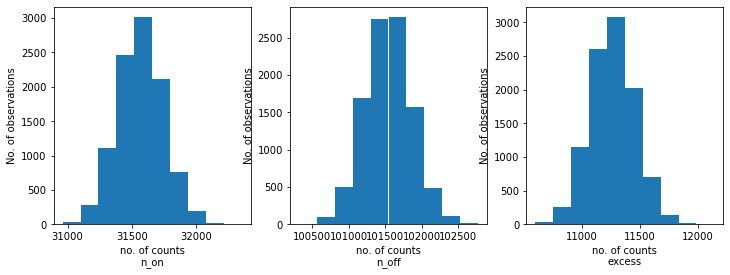

In [13]:

n_on = [dataset.counts.data.sum() for dataset in datasets]
n_off = [dataset.counts_off.data.sum() for dataset in datasets]
excess = [dataset.excess.data.sum() for dataset in datasets]

fix, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].hist(n_on)
axes[0].set_xlabel("no. of counts\nn_on")
axes[0].set_ylabel("No. of observations")
axes[1].hist(n_off)
axes[1].set_xlabel("no. of counts\nn_off")
axes[1].set_ylabel("No. of observations")
axes[2].hist(excess)
axes[2].set_xlabel("no. of counts\nexcess");
axes[2].set_ylabel("No. of observations")

In [14]:

%%time
results = []
for dataset in datasets:
    dataset.models = model.copy()
    fit = Fit([dataset])
    result = fit.optimize()
    results.append(
        {
            "index": result.parameters["index"].value,
            "amplitude": result.parameters["amplitude"].value,
            "lambda_": result.parameters["lambda_"].value,
        }
    )

CPU times: user 24min 59s, sys: 4.26 s, total: 25min 3s
Wall time: 25min 3s


In [15]:
results

[{'index': 2.2277014890350046,
  'amplitude': 1.2361699597883032e-12,
  'lambda_': 0.8771913199199592},
 {'index': 2.256141939366527,
  'amplitude': 1.1592170018498003e-12,
  'lambda_': 0.9123668648988691},
 {'index': 2.2673187750347403,
  'amplitude': 1.164801174921426e-12,
  'lambda_': 0.9770119045607368},
 {'index': 2.204478662830411,
  'amplitude': 1.3707461586045393e-12,
  'lambda_': 1.1180169016820818},
 {'index': 2.162123369183518,
  'amplitude': 1.4941489960213284e-12,
  'lambda_': 1.149481269135693},
 {'index': 2.16195812798937,
  'amplitude': 1.4656723948010833e-12,
  'lambda_': 1.1630444804572702},
 {'index': 2.247214118644901,
  'amplitude': 1.2213017496185367e-12,
  'lambda_': 0.9388338034853017},
 {'index': 2.221837157834904,
  'amplitude': 1.2866730136361347e-12,
  'lambda_': 0.9936044166833219},
 {'index': 2.213182287647928,
  'amplitude': 1.2811266719895797e-12,
  'lambda_': 0.983066055358285},
 {'index': 2.2502531549190885,
  'amplitude': 1.1879297852981216e-12,
  'la

index: 2.2186071284453974 += 0.032680509115565456


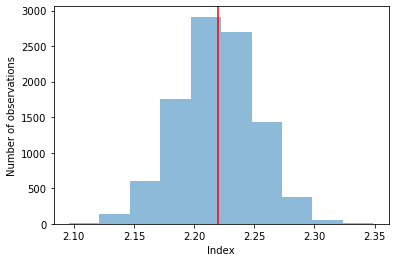

In [16]:
index = np.array([_["index"] for _ in results])
plt.hist(index, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["index"].value, color="red")
plt.xlabel("Index")
plt.ylabel("Number of observations")
print(f"index: {index.mean()} += {index.std()}")

amplitude: 1.2970181726222334e-12 += 1.0208933485022982e-13


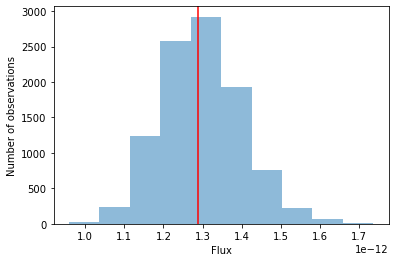

In [17]:
amplitude = np.array([_["amplitude"] for _ in results])
plt.hist(amplitude, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["amplitude"].value, color="red")
plt.xlabel("Flux")
plt.ylabel("Number of observations")
print(f"amplitude: {amplitude.mean()} += {amplitude.std()}")

lambda_: 1.0037542097907481 += 0.08118479690788624


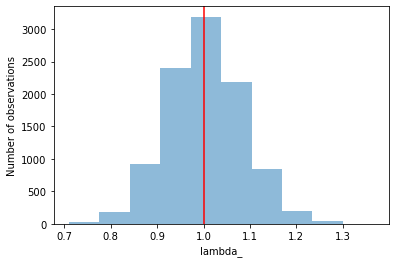

In [18]:
lambda_ = np.array([_["lambda_"] for _ in results])
plt.hist(lambda_, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["lambda_"].value, color="red")
plt.xlabel("lambda_")
plt.ylabel("Number of observations")
print(f"lambda_: {lambda_.mean()} += {lambda_.std()}")